In [14]:
import json
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats

In [15]:
# Carregar os dados do arquivo JSON
with open("dados_diferenca_em_metros.json", "r") as arquivo_json:
    dados = json.load(arquivo_json)

In [16]:
# Listas para armazenar as diferenças em metros de latitude e longitude
diferencas_latitude = []
diferencas_longitude = []

# Extrair as diferenças em metros de latitude e longitude dos dados
for dado in dados:
    if 'gnss_data' in dado:
        gnss_data = dado['gnss_data']
        diferenca_latitude = gnss_data['latitudeDiferencaMetros']
        diferenca_longitude = gnss_data['longitudeDiferencaMetros']
        diferencas_latitude.append(diferenca_latitude)
        diferencas_longitude.append(diferenca_longitude)

In [17]:
# Plotar as diferenças em metros de latitude e longitude
plt.figure(figsize=(10, 5))

<Figure size 1000x500 with 0 Axes>

<Figure size 1000x500 with 0 Axes>

Text(0, 0.5, 'Diferença (metros)')

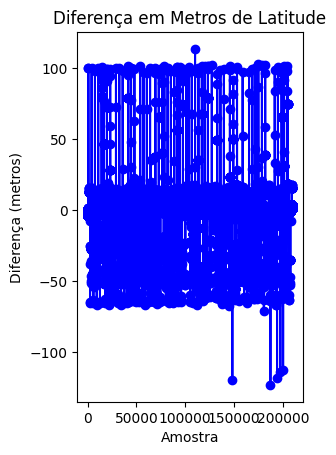

In [18]:
# Plot da diferença de latitude
plt.subplot(1, 2, 1)
plt.plot(diferencas_latitude, marker='o', linestyle='-', color='b')
plt.title('Diferença em Metros de Latitude')
plt.xlabel('Amostra')
plt.ylabel('Diferença (metros)')

Text(0, 0.5, 'Diferença (metros)')

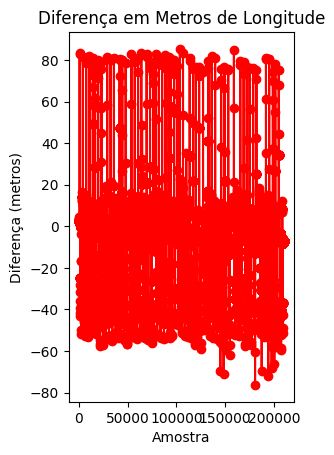

In [19]:
# Plot da diferença de longitude
plt.subplot(1, 2, 2)
plt.plot(diferencas_longitude, marker='o', linestyle='-', color='r')
plt.title('Diferença em Metros de Longitude')
plt.xlabel('Amostra')
plt.ylabel('Diferença (metros)')

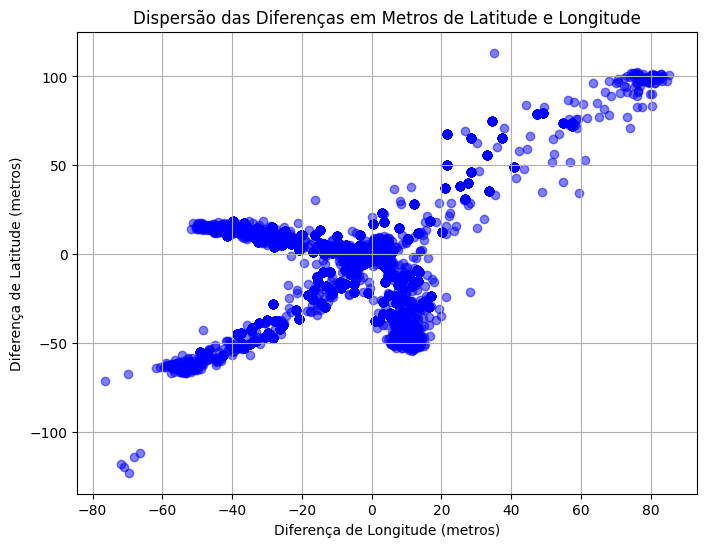

In [20]:
# Plotar o gráfico de dispersão das diferenças em metros de latitude e longitude
plt.figure(figsize=(8, 6))
plt.scatter(diferencas_longitude, diferencas_latitude, color='blue', alpha=0.5)
plt.title('Dispersão das Diferenças em Metros de Latitude e Longitude')
plt.xlabel('Diferença de Longitude (metros)')
plt.ylabel('Diferença de Latitude (metros)')
plt.grid(True)
plt.show()

In [24]:
# Calcular estatísticas para a diferença de latitude
print("Estatísticas para a diferença de latitude em metros:")
print("Média:", np.mean(diferencas_latitude))
print("Mediana:", np.median(diferencas_latitude))
moda_latitude = stats.mode(diferencas_latitude)
#print("Moda:", moda_latitude.mode[0])  # Acessando diretamente o valor de moda
print("Desvio padrão:", np.std(diferencas_latitude))
print("Variação:", np.var(diferencas_latitude))
print("Mínimo:", np.min(diferencas_latitude))
print("Máximo:", np.max(diferencas_latitude))
print()

Estatísticas para a diferença de latitude em metros:
Média: -0.14790966935887775
Mediana: 0.08532531117089093
Desvio padrão: 6.130982045927534
Variação: 37.58894084748577
Mínimo: -122.99038038693834
Máximo: 113.37171392550226



In [26]:
# Calcular estatísticas para a diferença de longitude
print("Estatísticas para a diferença de longitude em metros:")
print("Média:", np.mean(diferencas_longitude))
print("Mediana:", np.median(diferencas_longitude))
#print("Moda:", stats.mode(diferencas_longitude)[0][0])
print("Desvio padrão:", np.std(diferencas_longitude))
print("Variação:", np.var(diferencas_longitude))
print("Mínimo:", np.min(diferencas_longitude))
print("Máximo:", np.max(diferencas_longitude))
print()

Estatísticas para a diferença de longitude em metros:
Média: -2.5297285190182577
Mediana: -2.088656979613006
Desvio padrão: 5.334371124564547
Variação: 28.455515294588032
Mínimo: -76.32783587556332
Máximo: 85.32053376361728



In [31]:
# Ordenar as diferenças
diferencas_latitude.sort()
diferencas_longitude.sort()

# Calcular as frequências acumuladas
frequencia_acumulada_latitude = np.arange(1, len(diferencas_latitude) + 1) / len(diferencas_latitude) * 100
frequencia_acumulada_longitude = np.arange(1, len(diferencas_longitude) + 1) / len(diferencas_longitude) * 100



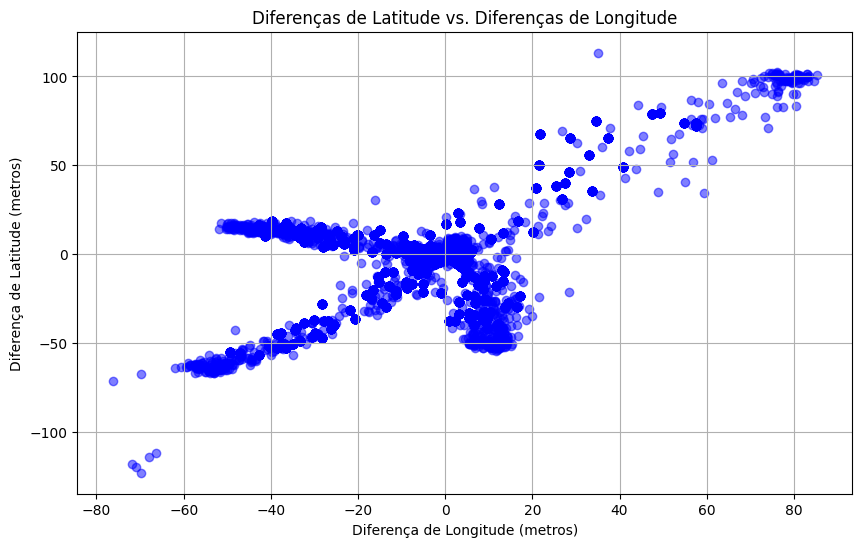

In [37]:
# Plotar o gráfico de dispersão
plt.figure(figsize=(10, 6))
plt.scatter(diferencas_longitude, diferencas_latitude, color='blue', alpha=0.5)
plt.title('Diferenças de Latitude vs. Diferenças de Longitude')
plt.xlabel('Diferença de Longitude (metros)')
plt.ylabel('Diferença de Latitude (metros)')
plt.grid(True)
plt.show()

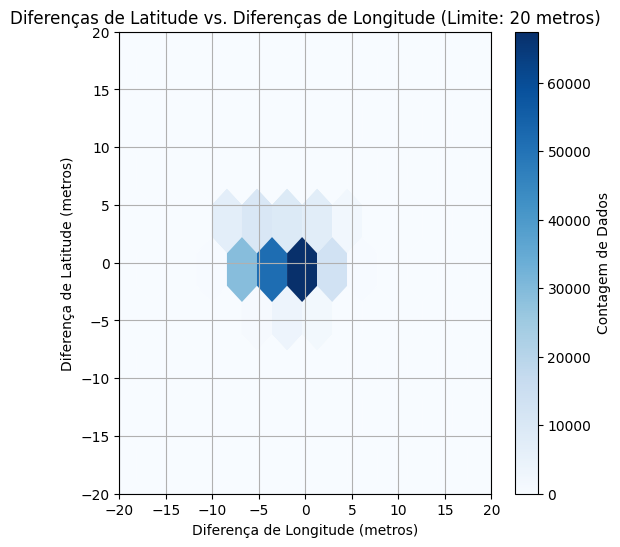

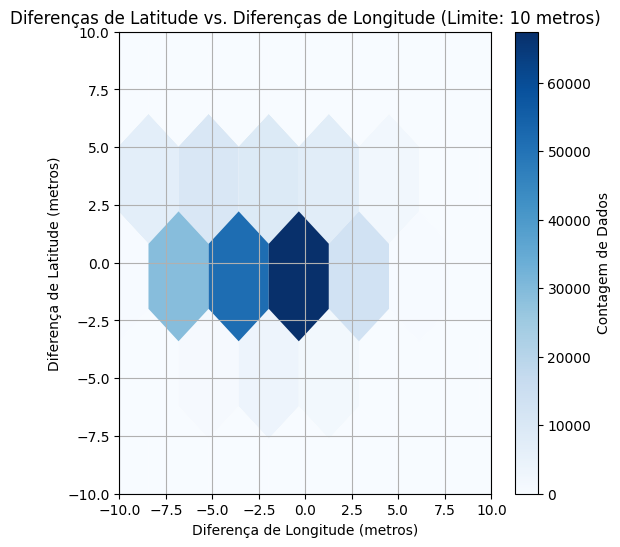

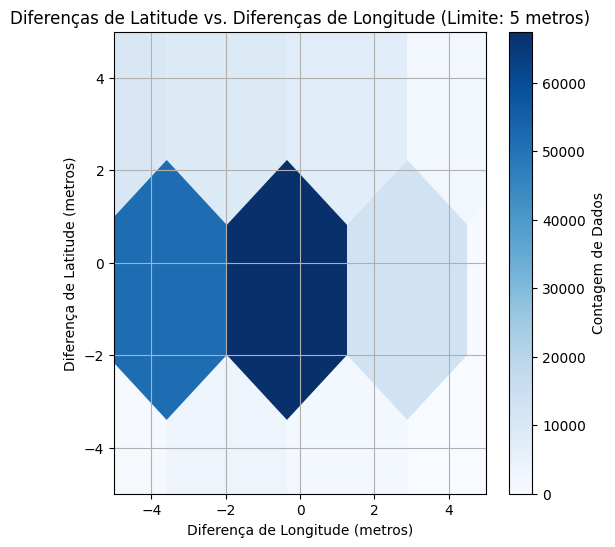

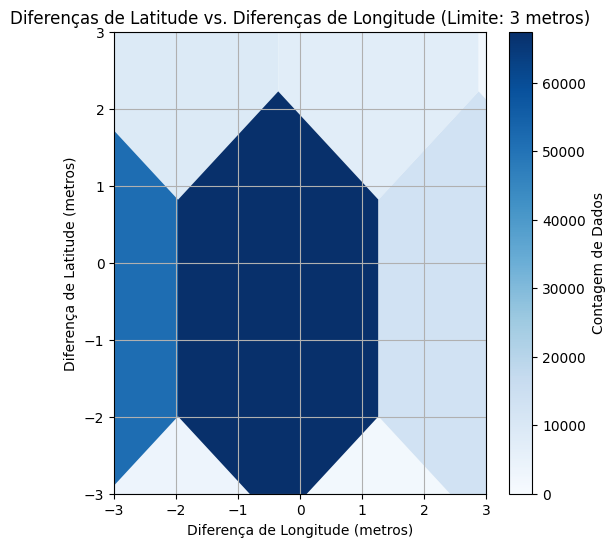

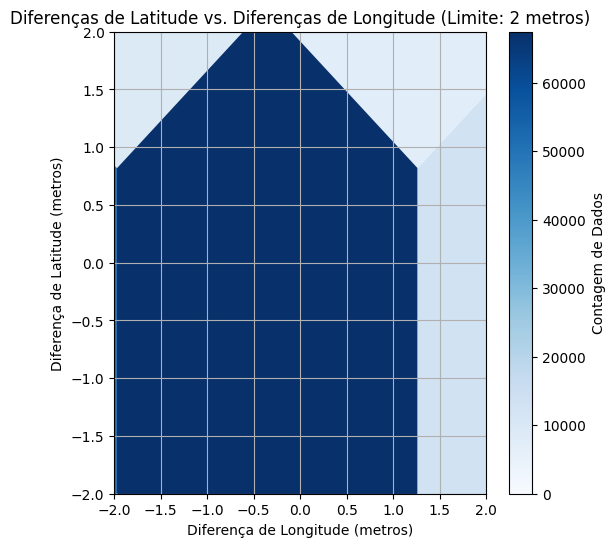

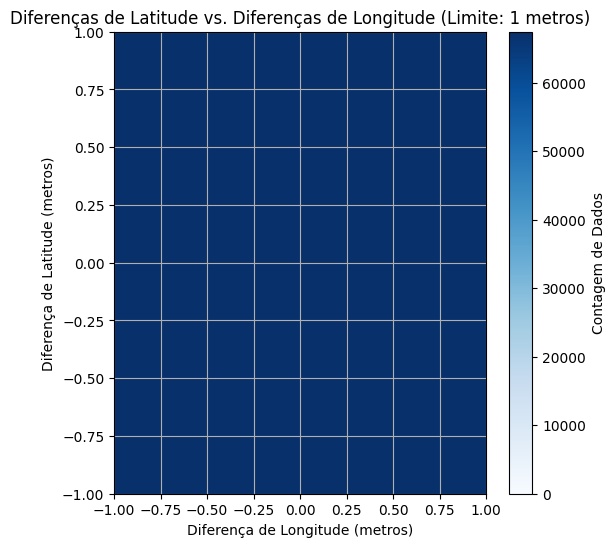

In [40]:
# Definir os limites para cada caso
limites = [20, 10, 5, 3, 2, 1]

# Plotar um gráfico separado para cada caso
for i, limite in enumerate(limites, 1):
    plt.figure(figsize=(6, 6))
    plt.hexbin(diferencas_longitude, diferencas_latitude, gridsize=50, cmap='Blues', edgecolors='none')
    plt.colorbar(label='Contagem de Dados')
    plt.title(f'Diferenças de Latitude vs. Diferenças de Longitude (Limite: {limite} metros)')
    plt.xlabel('Diferença de Longitude (metros)')
    plt.ylabel('Diferença de Latitude (metros)')
    plt.xlim(-limite, limite)
    plt.ylim(-limite, limite)
    plt.grid(True)
    plt.show()

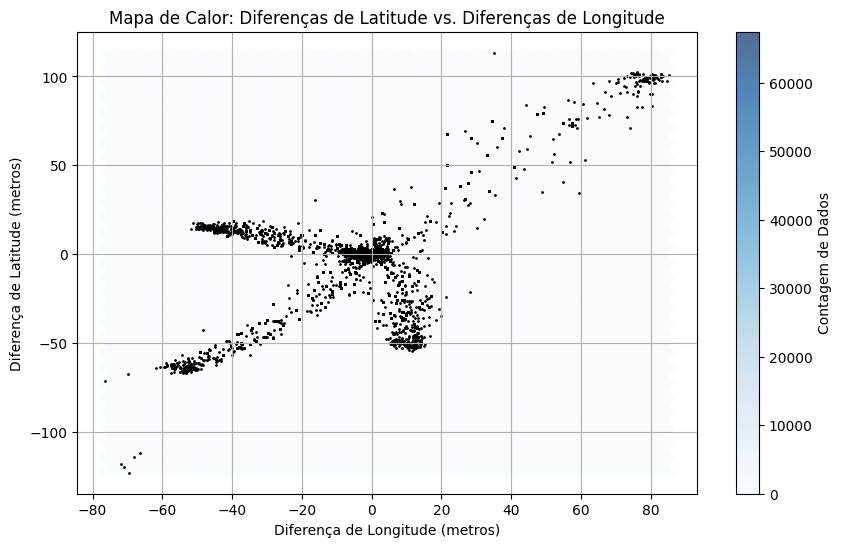

In [41]:
# Plotar um gráfico de dispersão com mapa de calor
plt.figure(figsize=(10, 6))
plt.hexbin(diferencas_longitude, diferencas_latitude, gridsize=50, cmap='Blues', edgecolors='none', alpha=0.7)
plt.colorbar(label='Contagem de Dados')
plt.scatter(diferencas_longitude, diferencas_latitude, color='black', s=1)
plt.title('Mapa de Calor: Diferenças de Latitude vs. Diferenças de Longitude')
plt.xlabel('Diferença de Longitude (metros)')
plt.ylabel('Diferença de Latitude (metros)')
plt.grid(True)
plt.show()

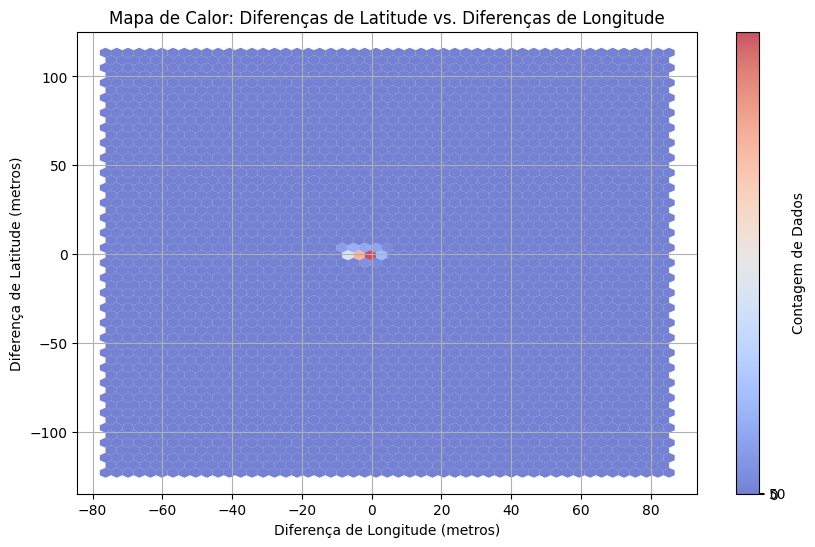

In [42]:
# Definir manualmente os limites para o mapa de calor
min_density = 0  # densidade mínima
max_density = 50  # densidade máxima

# Plotar um gráfico de dispersão com mapa de calor
plt.figure(figsize=(10, 6))
hb = plt.hexbin(diferencas_longitude, diferencas_latitude, gridsize=50, cmap='coolwarm', edgecolors='none', alpha=0.7)
plt.colorbar(hb, label='Contagem de Dados', ticks=[min_density, max_density])
plt.title('Mapa de Calor: Diferenças de Latitude vs. Diferenças de Longitude')
plt.xlabel('Diferença de Longitude (metros)')
plt.ylabel('Diferença de Latitude (metros)')
plt.grid(True)
plt.show()

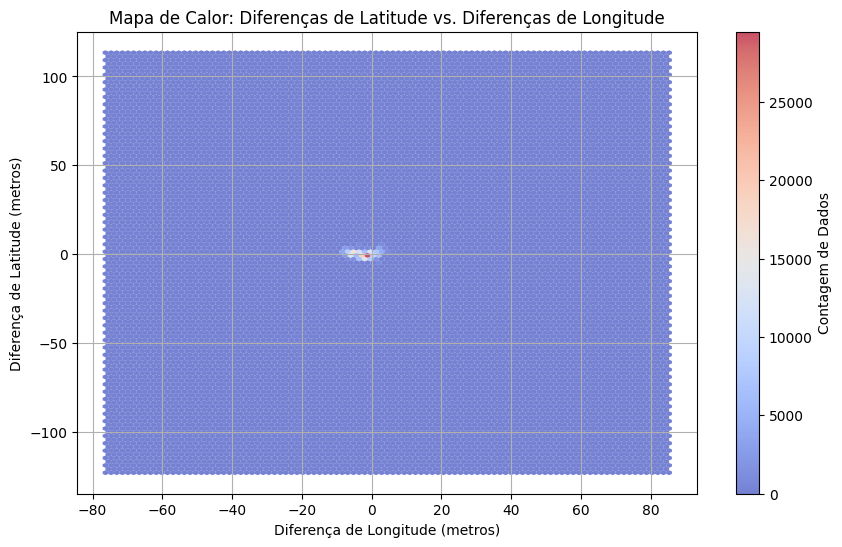

In [43]:
# Plotar um gráfico de dispersão com mapa de calor mais detalhado
plt.figure(figsize=(10, 6))
hb = plt.hexbin(diferencas_longitude, diferencas_latitude, gridsize=100, cmap='coolwarm', edgecolors='none', alpha=0.7)
plt.colorbar(hb, label='Contagem de Dados')
plt.title('Mapa de Calor: Diferenças de Latitude vs. Diferenças de Longitude')
plt.xlabel('Diferença de Longitude (metros)')
plt.ylabel('Diferença de Latitude (metros)')
plt.grid(True)
plt.show()

In [44]:
def plot_heatmap(diferencas_latitude, diferencas_longitude, gridsize):
    plt.figure(figsize=(10, 6))
    hb = plt.hexbin(diferencas_longitude, diferencas_latitude, gridsize=gridsize, cmap='coolwarm', edgecolors='none', alpha=0.7)
    plt.colorbar(hb, label='Contagem de Dados')
    plt.title(f'Mapa de Calor: Diferenças de Latitude vs. Diferenças de Longitude (Gridsize={gridsize})')
    plt.xlabel('Diferença de Longitude (metros)')
    plt.ylabel('Diferença de Latitude (metros)')
    plt.grid(True)
    plt.show()

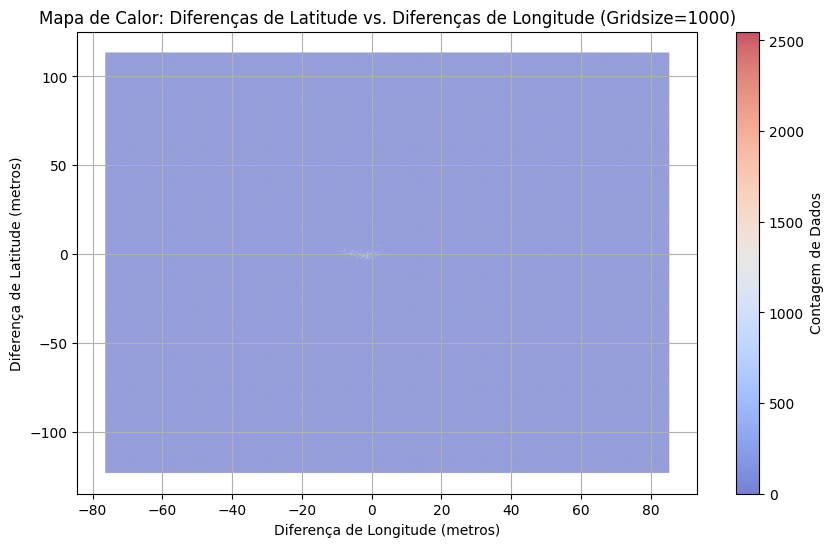

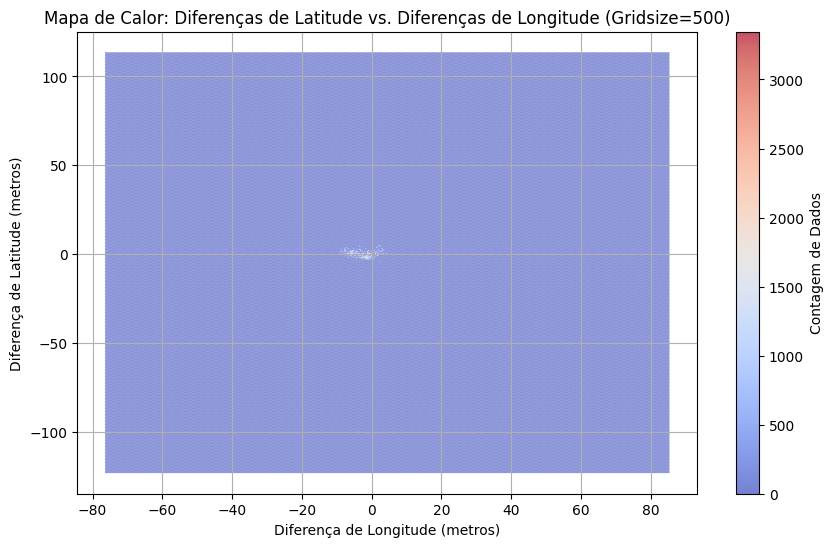

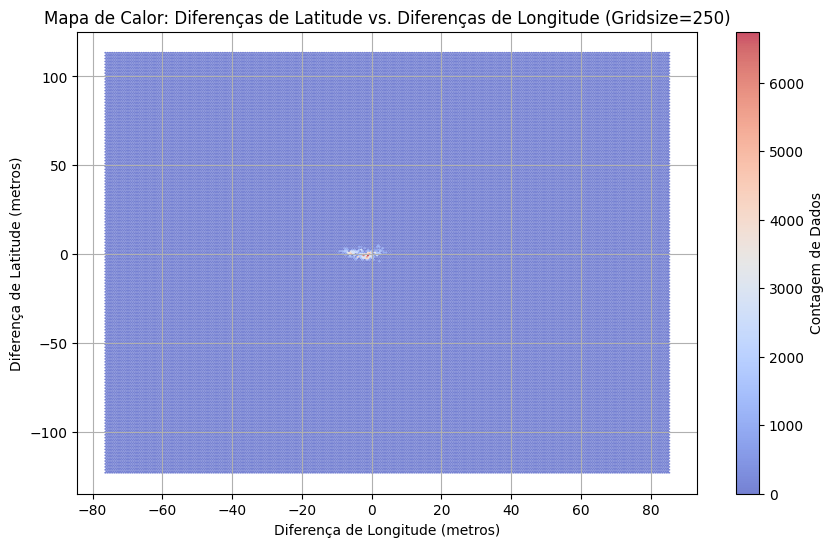

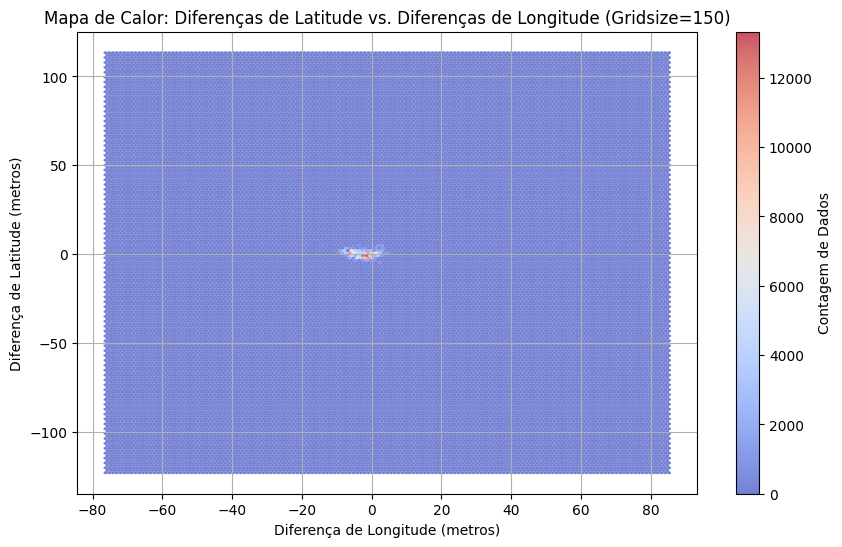

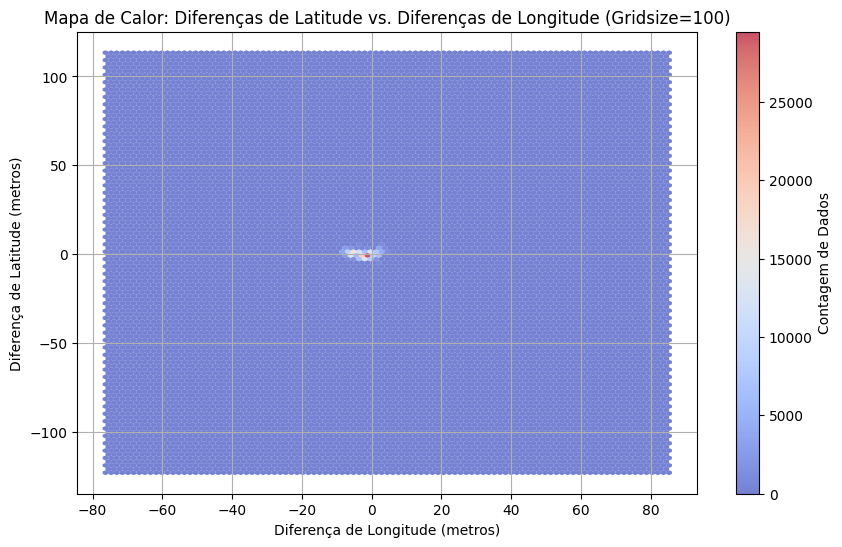

...

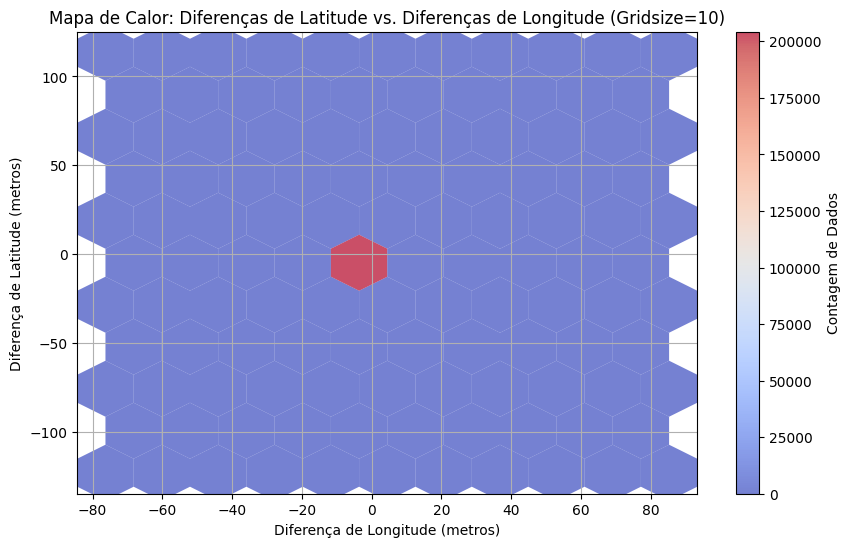

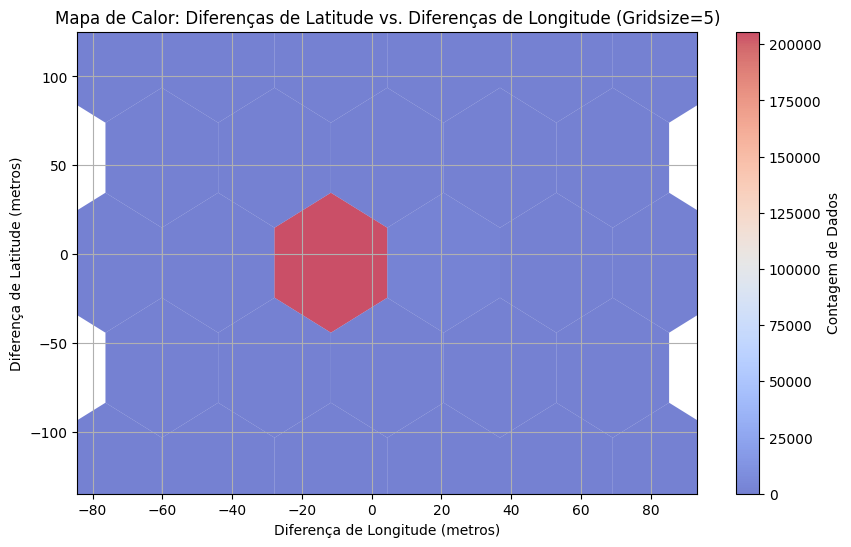

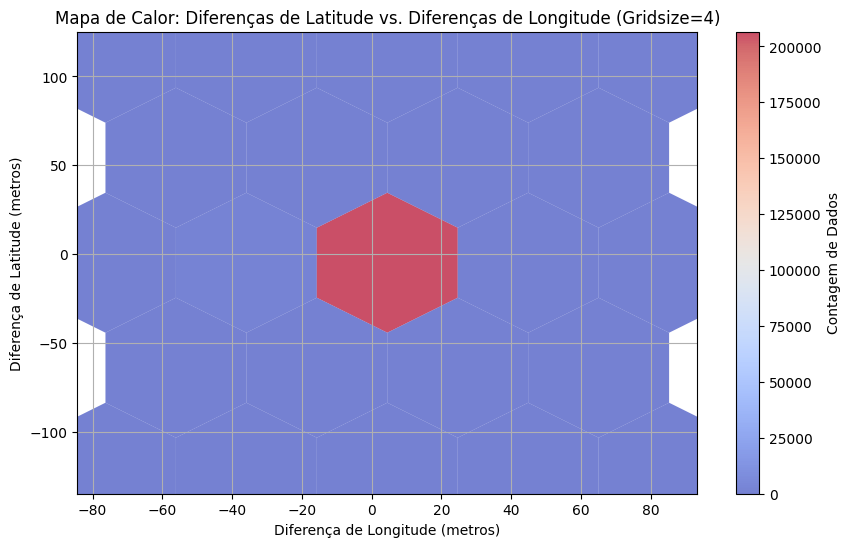

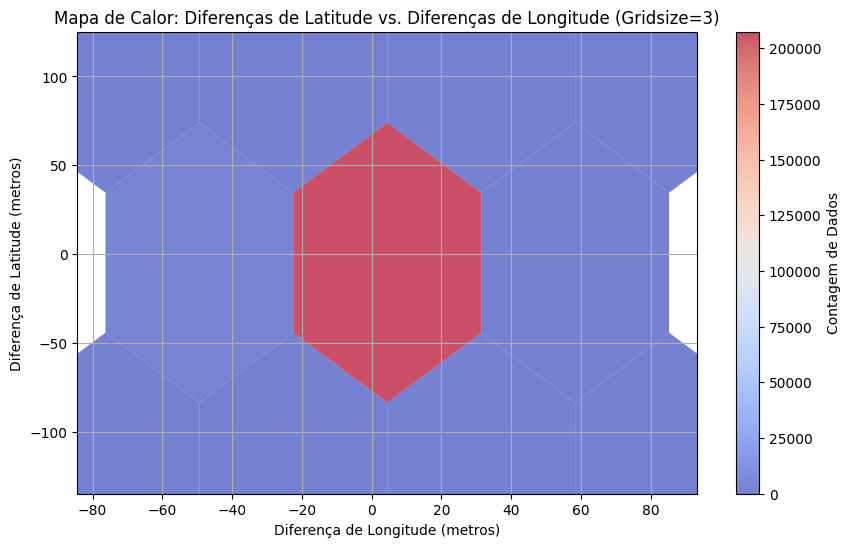

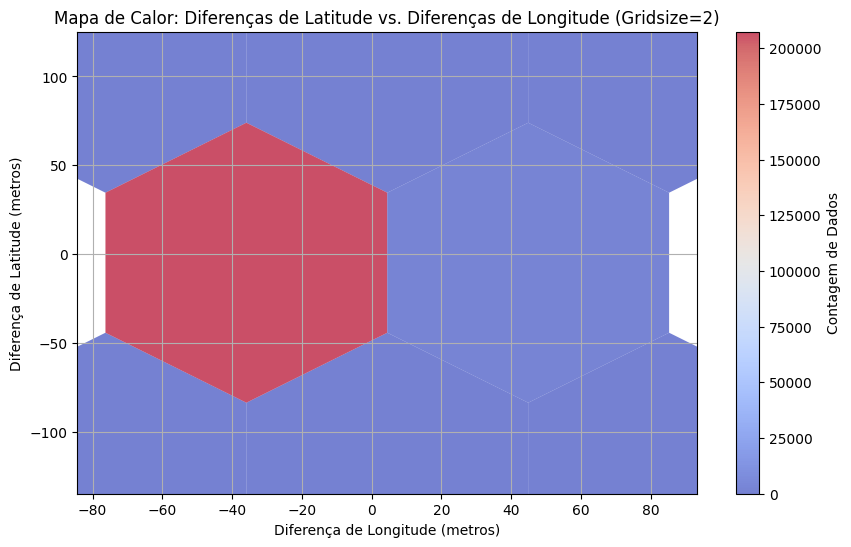

ZeroDivisionError: float division by zero

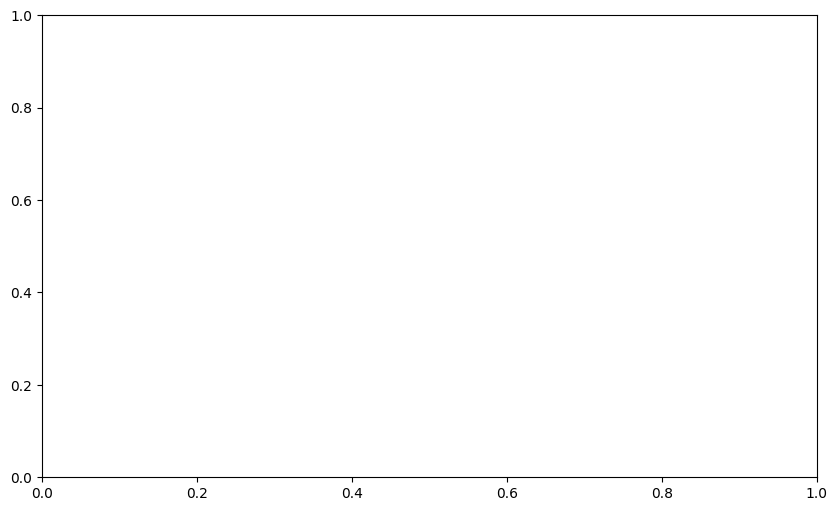

In [47]:
# Gerar mapas de calor para diferentes tamanhos de bin
tamanhos_bin = [1000,500,250,150,100,75,50,40,30, 20, 10, 5, 4, 3, 2, 1]
for tamanho_bin in tamanhos_bin:
    plot_heatmap(diferencas_latitude, diferencas_longitude, tamanho_bin)

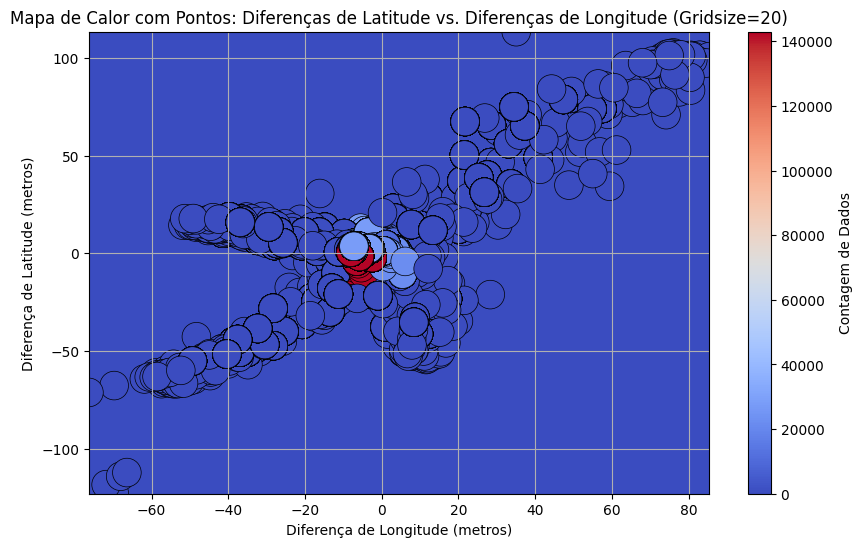

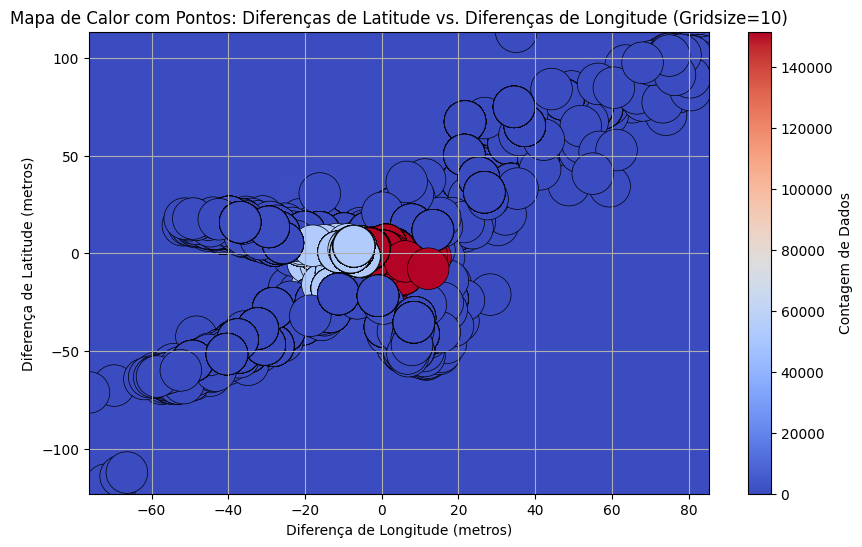

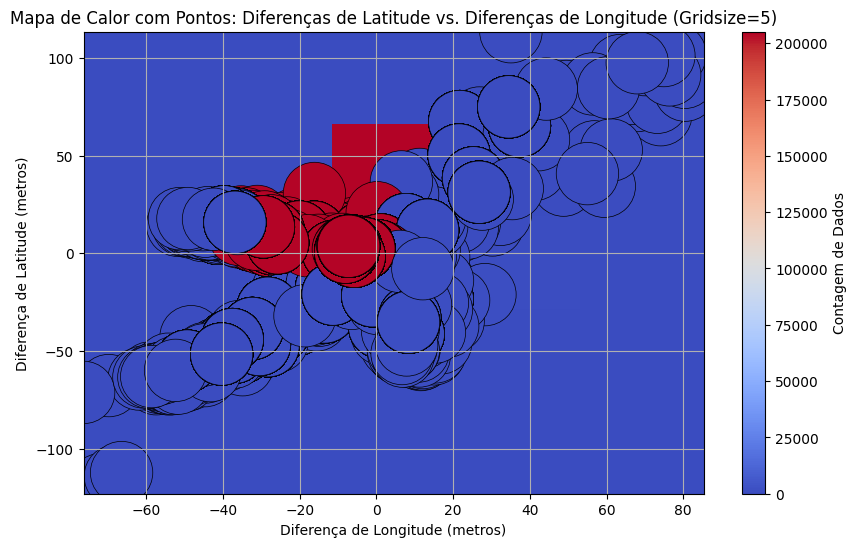

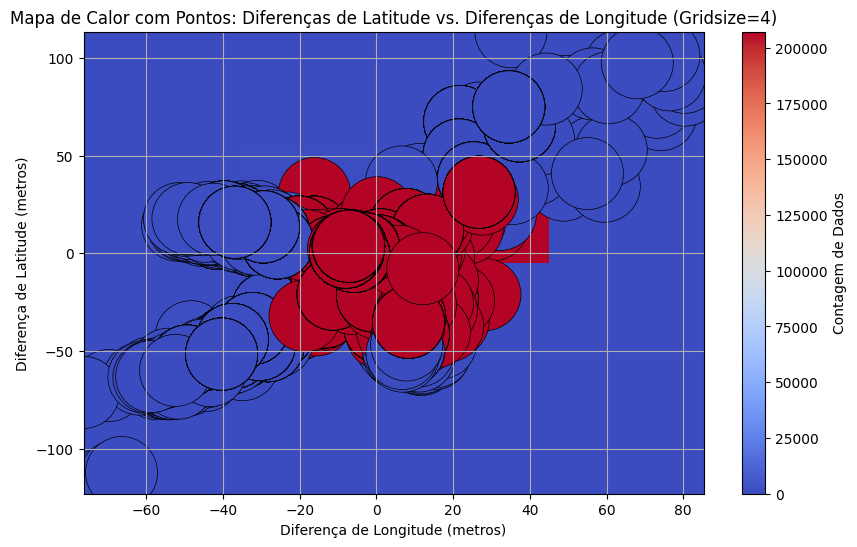

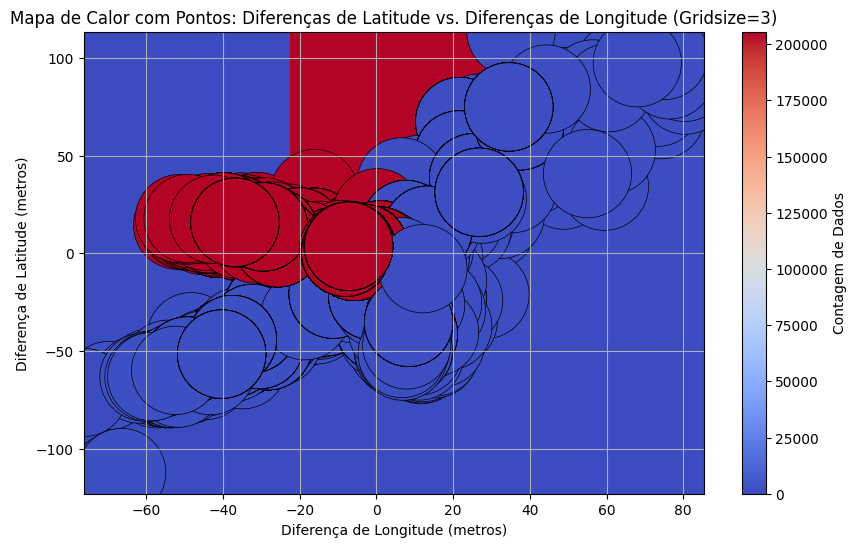

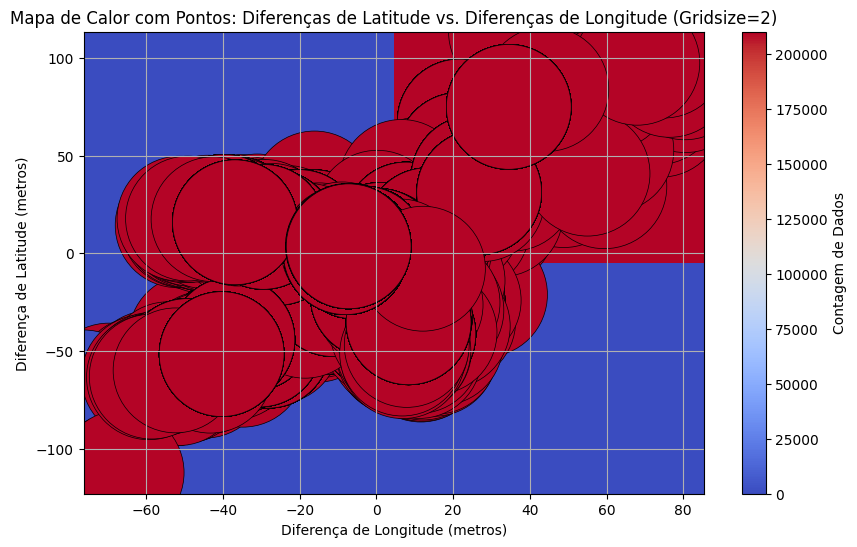

IndexError: index 1 is out of bounds for axis 0 with size 1

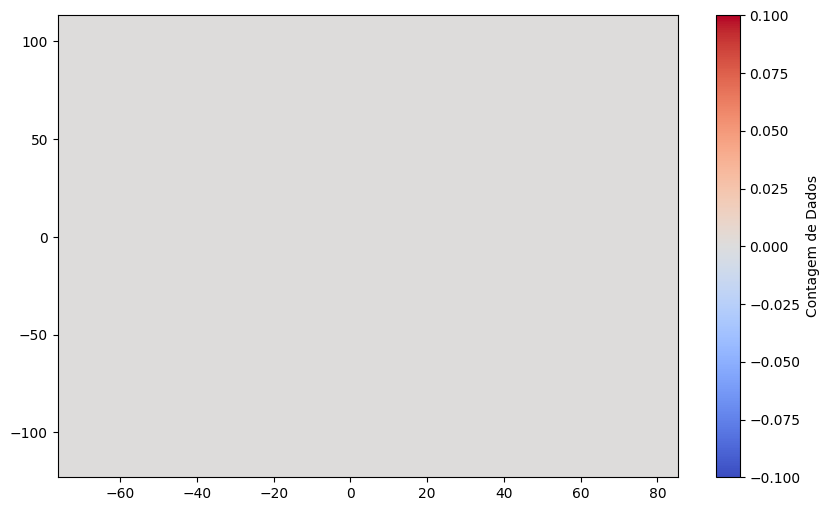

In [55]:
import json
import numpy as np
import matplotlib.pyplot as plt

def calculate_density(diferencas_latitude, diferencas_longitude, gridsize):
    x_min, x_max = np.min(diferencas_longitude), np.max(diferencas_longitude)
    y_min, y_max = np.min(diferencas_latitude), np.max(diferencas_latitude)
    x_bins = np.linspace(x_min, x_max, gridsize)
    y_bins = np.linspace(y_min, y_max, gridsize)
    density = np.zeros((gridsize, gridsize))
    for x, y in zip(diferencas_longitude, diferencas_latitude):
        ix = np.searchsorted(x_bins, x)
        iy = np.searchsorted(y_bins, y)
        if 0 <= ix < gridsize and 0 <= iy < gridsize:
            density[iy, ix] += 1
    return density

def plot_heatmap_with_points(diferencas_latitude, diferencas_longitude, gridsize):
    density = calculate_density(diferencas_latitude, diferencas_longitude, gridsize)
    x_min, x_max = np.min(diferencas_longitude), np.max(diferencas_longitude)
    y_min, y_max = np.min(diferencas_latitude), np.max(diferencas_latitude)
    x_bins = np.linspace(x_min, x_max, gridsize)
    y_bins = np.linspace(y_min, y_max, gridsize)
    plt.figure(figsize=(10, 6))
    plt.imshow(density, extent=(x_min, x_max, y_min, y_max), cmap='coolwarm', origin='lower', aspect='auto')
    plt.colorbar(label='Contagem de Dados')
    
    # Calcular o tamanho dos pontos com base na densidade
    sizes = np.zeros(len(diferencas_latitude))
    for i, (x, y) in enumerate(zip(diferencas_longitude, diferencas_latitude)):
        ix = np.searchsorted(x_bins, x)
        iy = np.searchsorted(y_bins, y)
        sizes[i] = density[iy, ix]
    
    # Limitar o tamanho máximo dos pontos conforme o tamanho do bin
    max_size = (x_bins[1] - x_bins[0]) * 50  # Ajuste o fator 50 conforme necessário
    plt.scatter(diferencas_longitude, diferencas_latitude, c=sizes, cmap='coolwarm', s=max_size, edgecolors='k', linewidths=0.5)
    
    plt.title(f'Mapa de Calor com Pontos: Diferenças de Latitude vs. Diferenças de Longitude (Gridsize={gridsize})')
    plt.xlabel('Diferença de Longitude (metros)')
    plt.ylabel('Diferença de Latitude (metros)')
    plt.grid(True)
    plt.show()

# Carregar os dados do arquivo JSON
with open("dados_diferenca_em_metros.json", "r") as arquivo_json:
    dados = json.load(arquivo_json)

# Listas para armazenar as diferenças em metros de latitude e longitude
diferencas_latitude = []
diferencas_longitude = []

# Extrair as diferenças em metros de latitude e longitude dos dados
for dado in dados:
    if 'gnss_data' in dado:
        gnss_data = dado['gnss_data']
        diferenca_latitude = gnss_data['latitudeDiferencaMetros']
        diferenca_longitude = gnss_data['longitudeDiferencaMetros']
        diferencas_latitude.append(diferenca_latitude)
        diferencas_longitude.append(diferenca_longitude)

# Gerar mapas de calor para diferentes tamanhos de bin com pontos
tamanhos_bin = [20, 10, 5, 4, 3, 2, 1]
for tamanho_bin in tamanhos_bin:
    plot_heatmap_with_points(diferencas_latitude, diferencas_longitude, tamanho_bin)


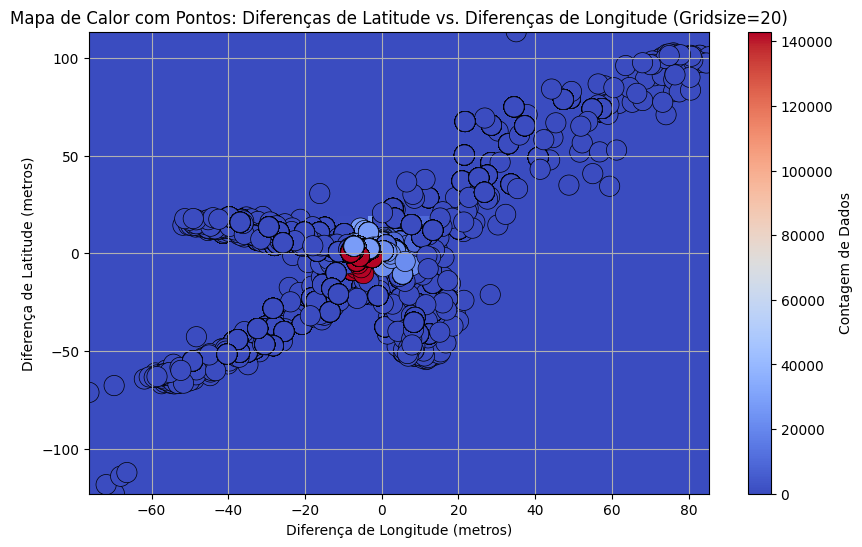

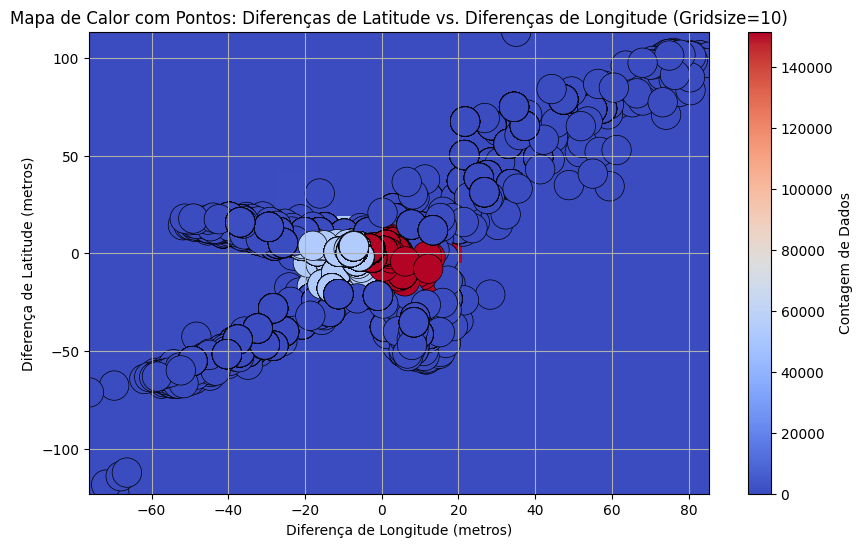

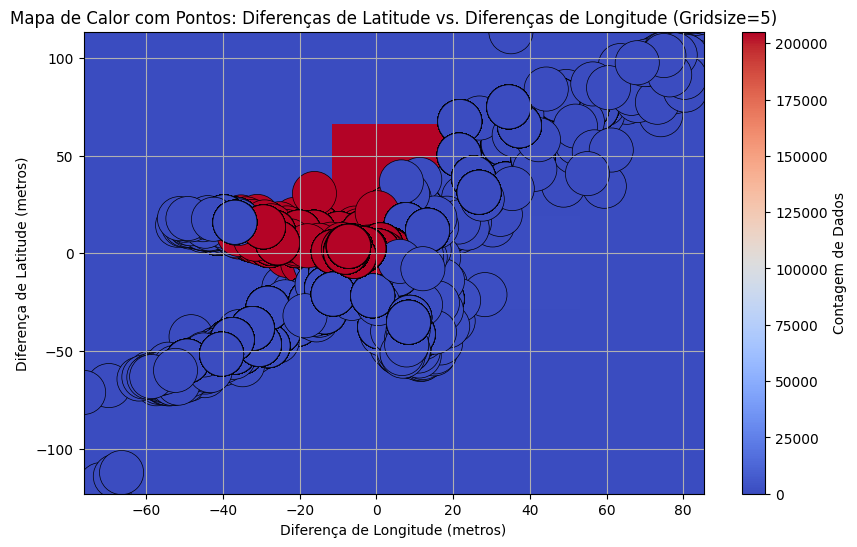

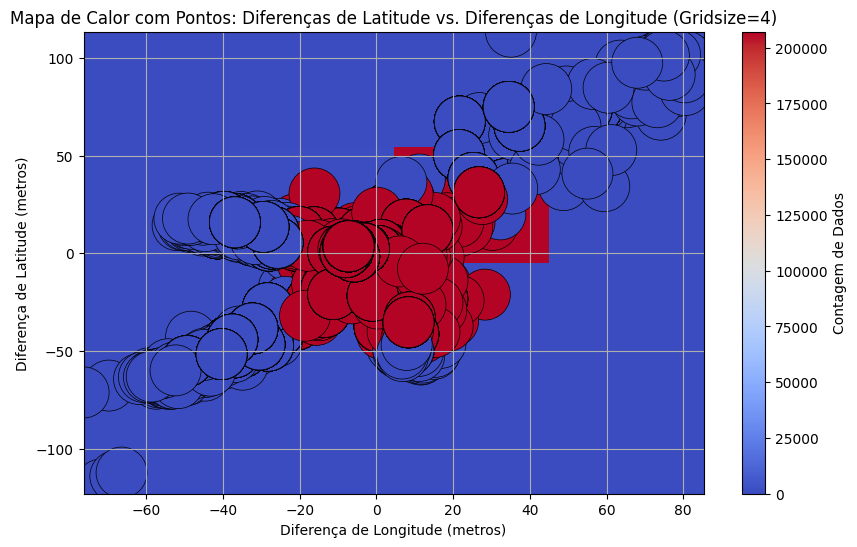

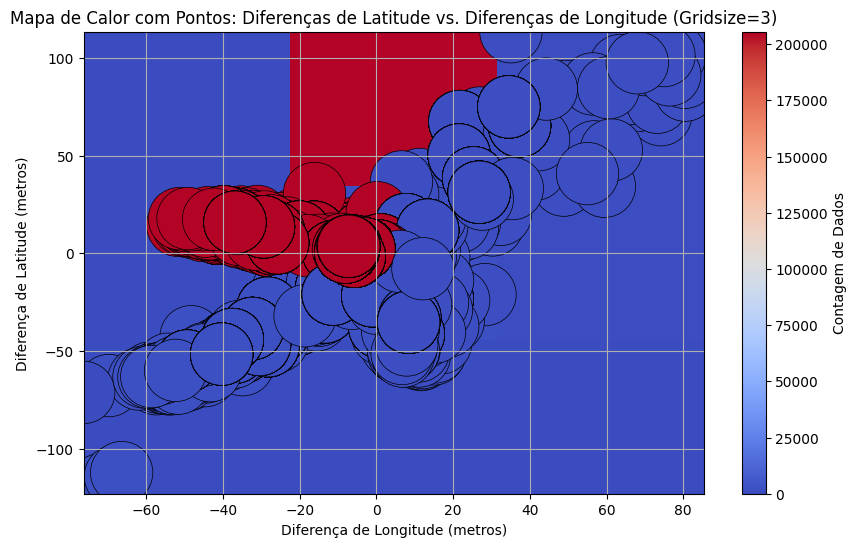

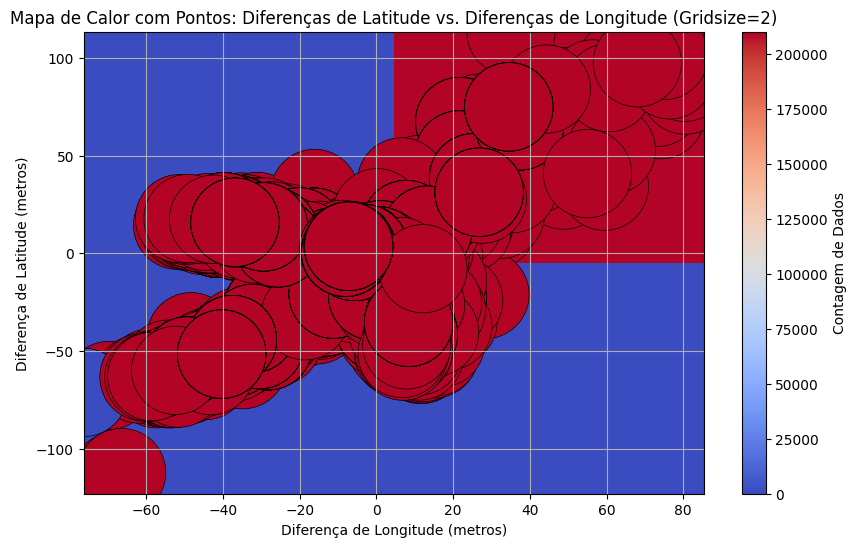

IndexError: index 1 is out of bounds for axis 0 with size 1

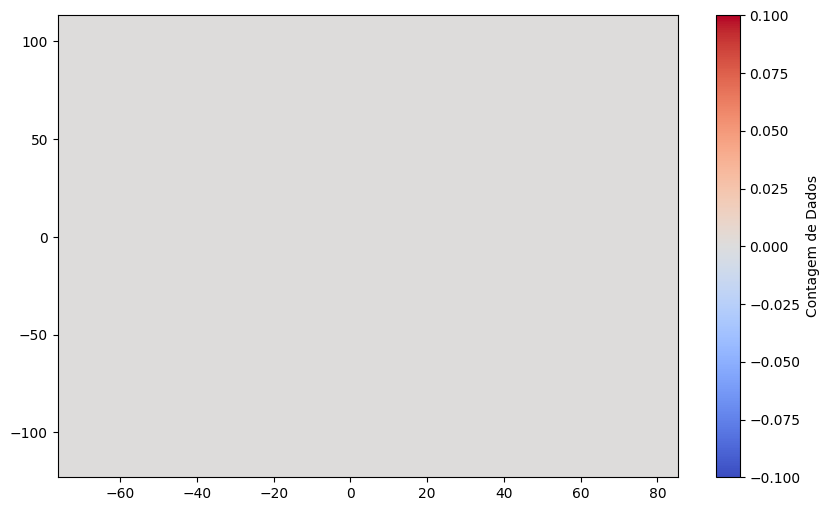

In [56]:
import json
import numpy as np
import matplotlib.pyplot as plt

def calculate_density(diferencas_latitude, diferencas_longitude, gridsize):
    x_min, x_max = np.min(diferencas_longitude), np.max(diferencas_longitude)
    y_min, y_max = np.min(diferencas_latitude), np.max(diferencas_latitude)
    x_bins = np.linspace(x_min, x_max, gridsize)
    y_bins = np.linspace(y_min, y_max, gridsize)
    density = np.zeros((gridsize, gridsize))
    for x, y in zip(diferencas_longitude, diferencas_latitude):
        ix = np.searchsorted(x_bins, x)
        iy = np.searchsorted(y_bins, y)
        if 0 <= ix < gridsize and 0 <= iy < gridsize:
            density[iy, ix] += 1
    return density

def plot_heatmap_with_points(diferencas_latitude, diferencas_longitude, gridsize):
    density = calculate_density(diferencas_latitude, diferencas_longitude, gridsize)
    x_min, x_max = np.min(diferencas_longitude), np.max(diferencas_longitude)
    y_min, y_max = np.min(diferencas_latitude), np.max(diferencas_latitude)
    x_bins = np.linspace(x_min, x_max, gridsize)
    y_bins = np.linspace(y_min, y_max, gridsize)
    plt.figure(figsize=(10, 6))
    plt.imshow(density, extent=(x_min, x_max, y_min, y_max), cmap='coolwarm', origin='lower', aspect='auto')
    plt.colorbar(label='Contagem de Dados')
    
    # Calcular o tamanho dos pontos com base na densidade
    sizes = np.zeros(len(diferencas_latitude))
    for i, (x, y) in enumerate(zip(diferencas_longitude, diferencas_latitude)):
        ix = np.searchsorted(x_bins, x)
        iy = np.searchsorted(y_bins, y)
        sizes[i] = density[iy, ix]
    
    # Limitar o tamanho máximo dos pontos conforme o tamanho do bin
    max_size = (x_bins[1] - x_bins[0]) * 25  # Reduzir pela metade
    plt.scatter(diferencas_longitude, diferencas_latitude, c=sizes, cmap='coolwarm', s=max_size, edgecolors='k', linewidths=0.5)
    
    plt.title(f'Mapa de Calor com Pontos: Diferenças de Latitude vs. Diferenças de Longitude (Gridsize={gridsize})')
    plt.xlabel('Diferença de Longitude (metros)')
    plt.ylabel('Diferença de Latitude (metros)')
    plt.grid(True)
    plt.show()

# Carregar os dados do arquivo JSON
with open("dados_diferenca_em_metros.json", "r") as arquivo_json:
    dados = json.load(arquivo_json)

# Listas para armazenar as diferenças em metros de latitude e longitude
diferencas_latitude = []
diferencas_longitude = []

# Extrair as diferenças em metros de latitude e longitude dos dados
for dado in dados:
    if 'gnss_data' in dado:
        gnss_data = dado['gnss_data']
        diferenca_latitude = gnss_data['latitudeDiferencaMetros']
        diferenca_longitude = gnss_data['longitudeDiferencaMetros']
        diferencas_latitude.append(diferenca_latitude)
        diferencas_longitude.append(diferenca_longitude)

# Gerar mapas de calor para diferentes tamanhos de bin com pontos
tamanhos_bin = [20, 10, 5, 4, 3, 2, 1]
for tamanho_bin in tamanhos_bin:
    plot_heatmap_with_points(diferencas_latitude, diferencas_longitude, tamanho_bin)


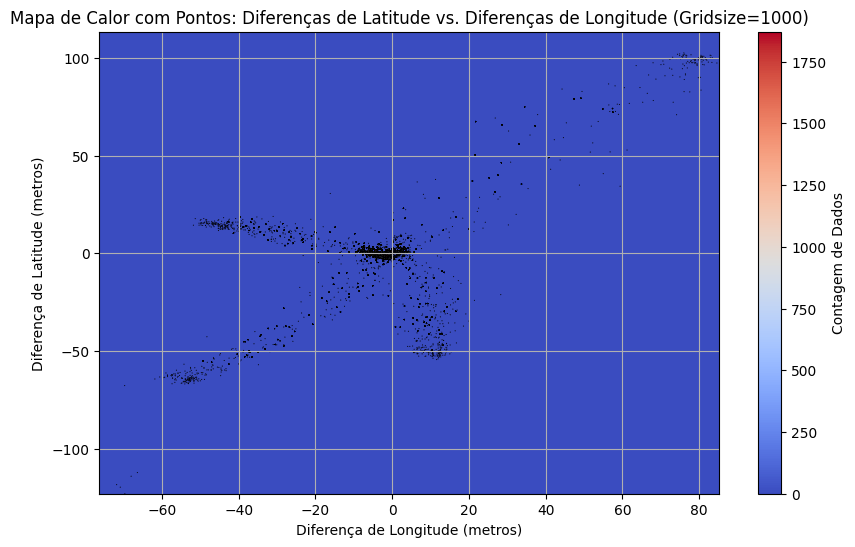

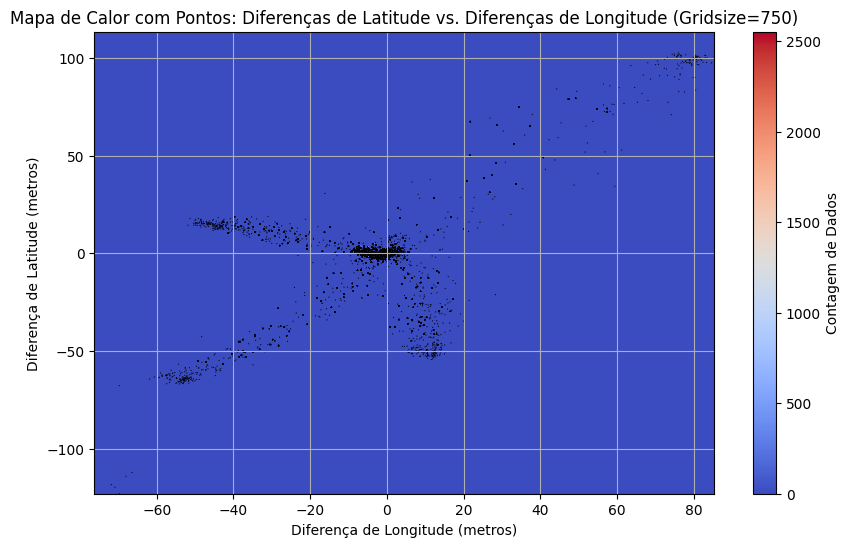

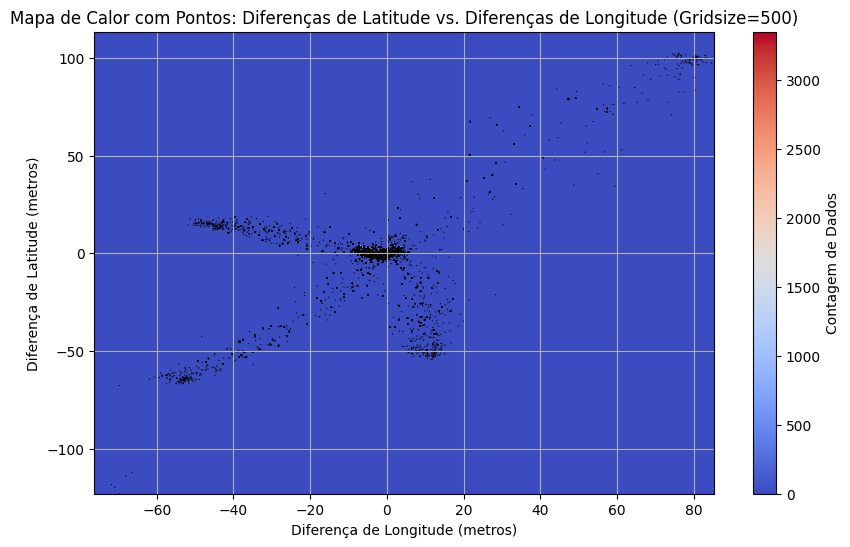

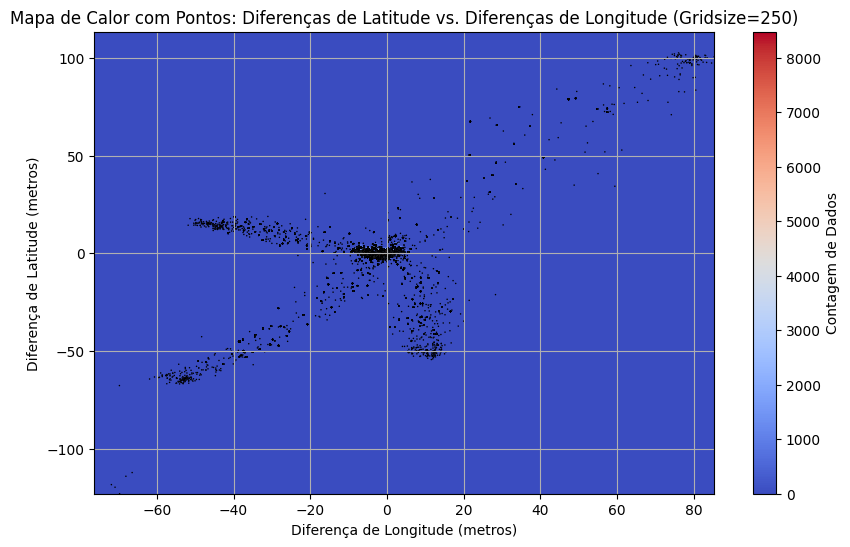

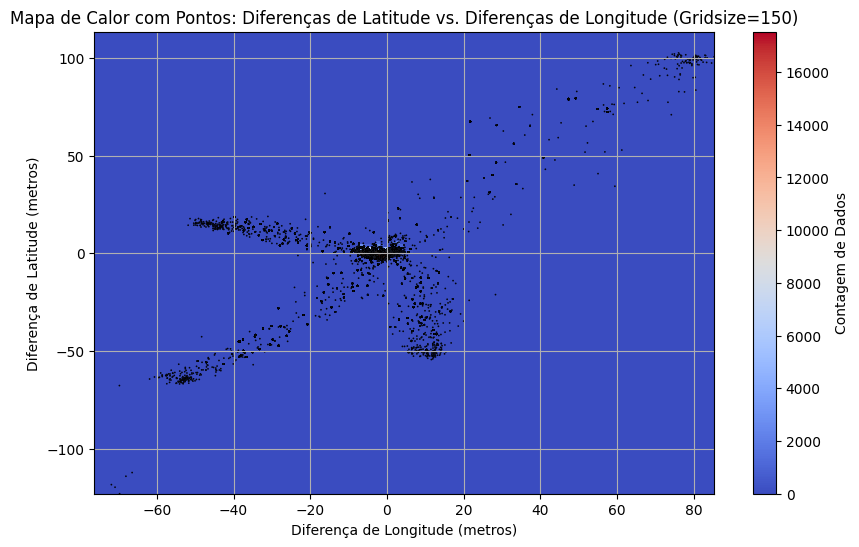

...

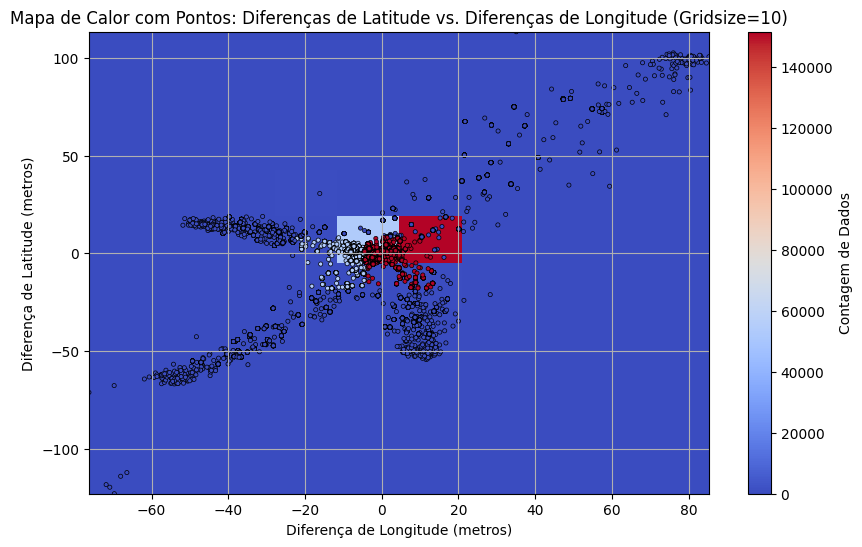

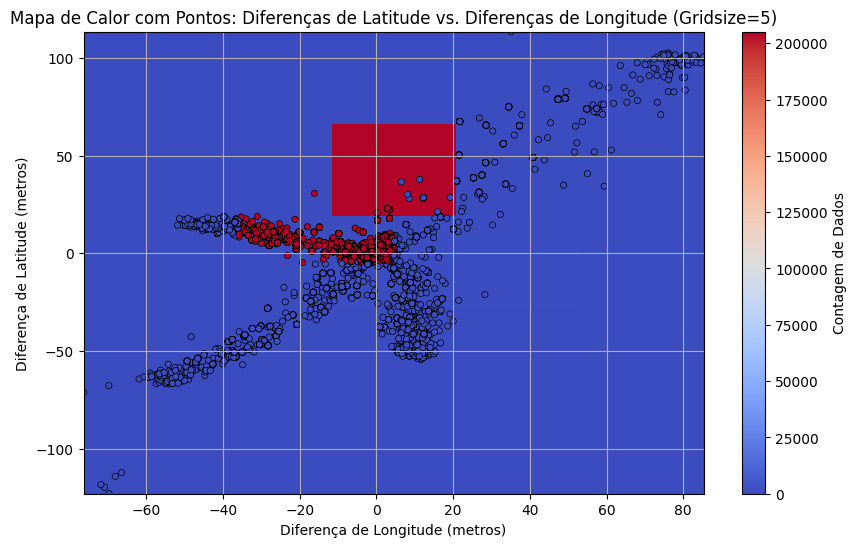

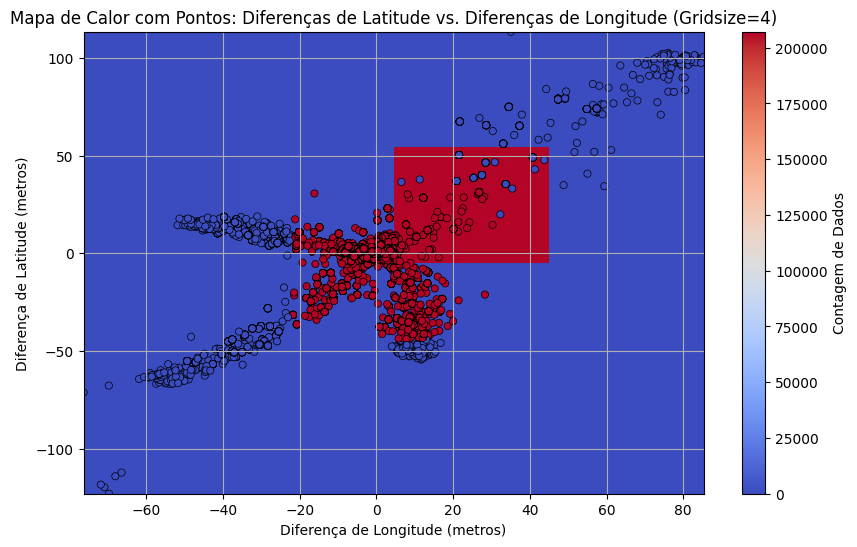

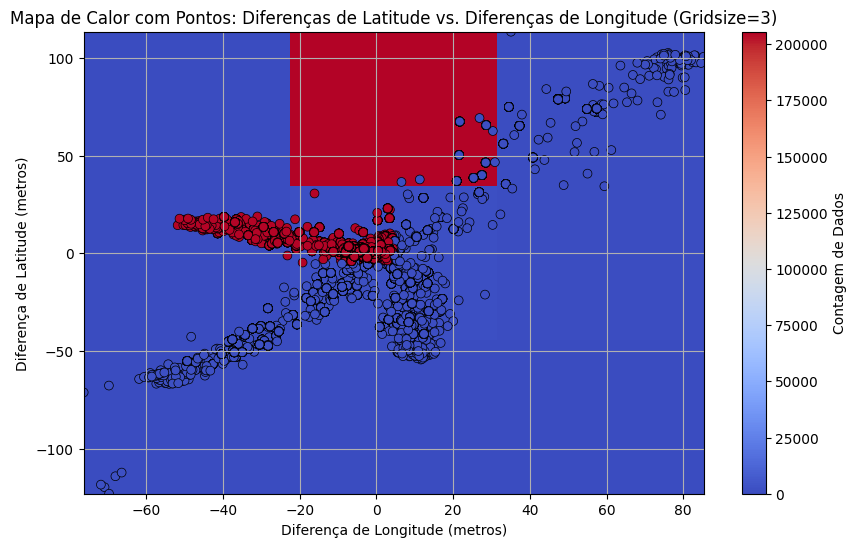

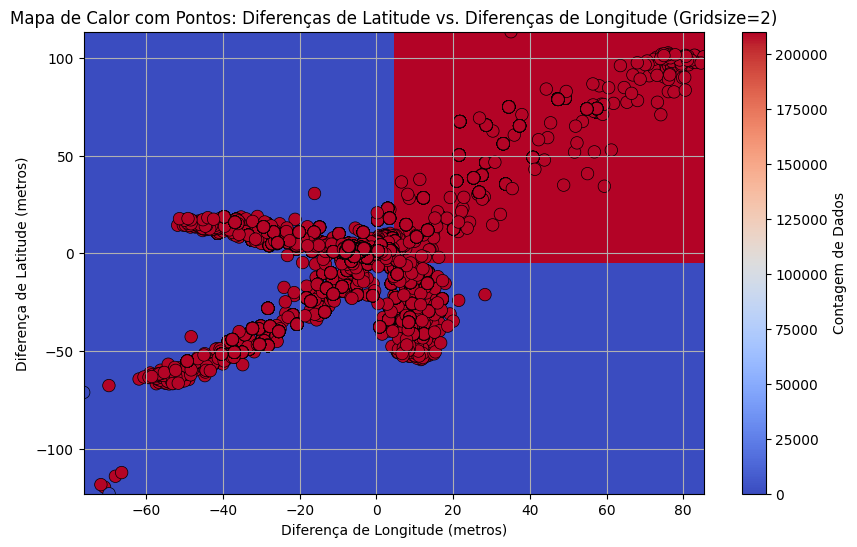

IndexError: index 1 is out of bounds for axis 0 with size 1

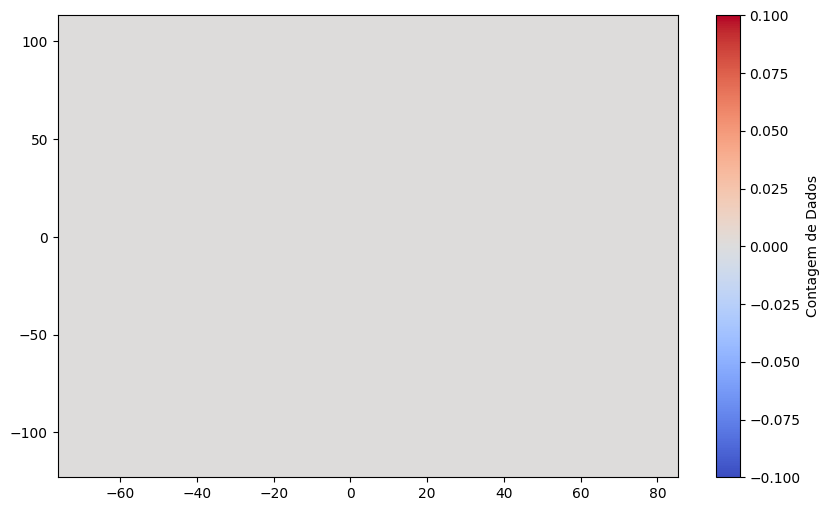

In [61]:
import json
import numpy as np
import matplotlib.pyplot as plt

def calculate_density(diferencas_latitude, diferencas_longitude, gridsize):
    x_min, x_max = np.min(diferencas_longitude), np.max(diferencas_longitude)
    y_min, y_max = np.min(diferencas_latitude), np.max(diferencas_latitude)
    x_bins = np.linspace(x_min, x_max, gridsize)
    y_bins = np.linspace(y_min, y_max, gridsize)
    density = np.zeros((gridsize, gridsize))
    for x, y in zip(diferencas_longitude, diferencas_latitude):
        ix = np.searchsorted(x_bins, x)
        iy = np.searchsorted(y_bins, y)
        if 0 <= ix < gridsize and 0 <= iy < gridsize:
            density[iy, ix] += 1
    return density

def plot_heatmap_with_points(diferencas_latitude, diferencas_longitude, gridsize):
    density = calculate_density(diferencas_latitude, diferencas_longitude, gridsize)
    x_min, x_max = np.min(diferencas_longitude), np.max(diferencas_longitude)
    y_min, y_max = np.min(diferencas_latitude), np.max(diferencas_latitude)
    x_bins = np.linspace(x_min, x_max, gridsize)
    y_bins = np.linspace(y_min, y_max, gridsize)
    plt.figure(figsize=(10, 6))
    plt.imshow(density, extent=(x_min, x_max, y_min, y_max), cmap='coolwarm', origin='lower', aspect='auto')
    plt.colorbar(label='Contagem de Dados')
    
    # Calcular o tamanho dos pontos com base na densidade
    sizes = np.zeros(len(diferencas_latitude))
    for i, (x, y) in enumerate(zip(diferencas_longitude, diferencas_latitude)):
        ix = np.searchsorted(x_bins, x)
        iy = np.searchsorted(y_bins, y)
        sizes[i] = density[iy, ix]
    
    # Limitar o tamanho máximo dos pontos conforme o tamanho do bin
    max_size = (x_bins[1] - x_bins[0]) * 0.5  # Reduzir ainda mais
    plt.scatter(diferencas_longitude, diferencas_latitude, c=sizes, cmap='coolwarm', s=max_size, edgecolors='k', linewidths=0.5)
    
    plt.title(f'Mapa de Calor com Pontos: Diferenças de Latitude vs. Diferenças de Longitude (Gridsize={gridsize})')
    plt.xlabel('Diferença de Longitude (metros)')
    plt.ylabel('Diferença de Latitude (metros)')
    plt.grid(True)
    plt.show()

# Gerar mapas de calor para diferentes tamanhos de bin com pontos
tamanhos_bin = [1000,750,500,250,150,100,75,50,40,30,20, 10, 5, 4, 3, 2, 1]
for tamanho_bin in tamanhos_bin:
    plot_heatmap_with_points(diferencas_latitude, diferencas_longitude, tamanho_bin)


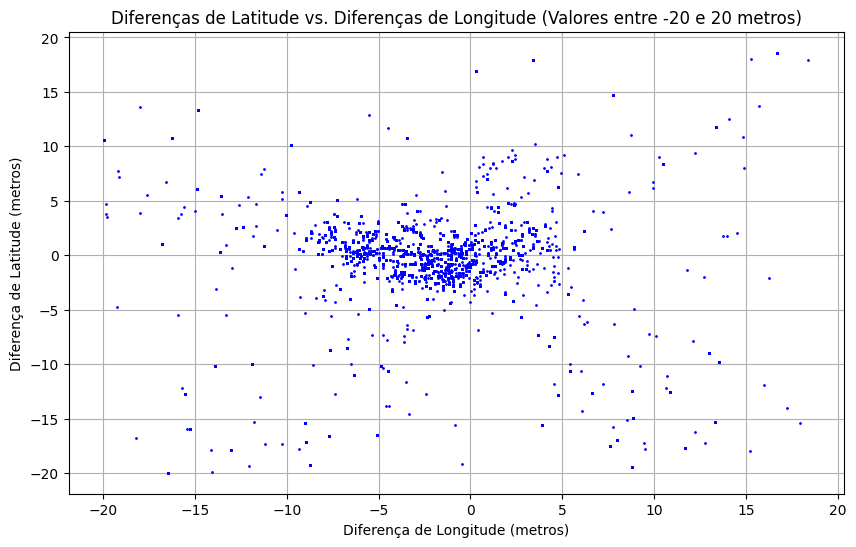

In [66]:
import json
import numpy as np
import matplotlib.pyplot as plt

# Carregar os dados do arquivo JSON
with open("dados_diferenca_em_metros.json", "r") as arquivo_json:
    dados = json.load(arquivo_json)

# Listas para armazenar as diferenças em metros de latitude e longitude
diferencas_latitude = []
diferencas_longitude = []

# Extrair as diferenças em metros de latitude e longitude dos dados
for dado in dados:
    if 'gnss_data' in dado:
        gnss_data = dado['gnss_data']
        diferenca_latitude = gnss_data['latitudeDiferencaMetros']
        diferenca_longitude = gnss_data['longitudeDiferencaMetros']
        diferencas_latitude.append(diferenca_latitude)
        diferencas_longitude.append(diferenca_longitude)

# Filtrar os dados para valores entre -20 e 20 metros em ambas as coordenadas
diferencas_filtered = [(lat, long) for lat, long in zip(diferencas_latitude, diferencas_longitude) if -20 <= lat <= 20 and -20 <= long <= 20]
diferencas_latitude_filtered, diferencas_longitude_filtered = zip(*diferencas_filtered)


# Plotar os dados filtrados
plt.figure(figsize=(10, 6))
plt.plot(diferencas_longitude_filtered, diferencas_latitude_filtered, 'bo', markersize=1)
plt.title('Diferenças de Latitude vs. Diferenças de Longitude (Valores entre -20 e 20 metros)')
plt.xlabel('Diferença de Longitude (metros)')
plt.ylabel('Diferença de Latitude (metros)')
plt.grid(True)
plt.show()


In [67]:
# Encontrar os índices onde a latitude ou a longitude estão acima de 20 metros
indices_acima_20 = [i for i, (lat, long) in enumerate(zip(diferencas_latitude, diferencas_longitude)) if lat > 20 or long > 20]

# Exibir os índices e as respectivas coordenadas onde ocorrem valores acima de 20 metros
for idx in indices_acima_20:
    print(f"Índice: {idx}, Latitude: {diferencas_latitude[idx]}, Longitude: {diferencas_longitude[idx]}")


Índice: 862, Latitude: 100.02001352864318, Longitude: 83.48448939155787
Índice: 863, Latitude: 99.83994992671069, Longitude: 82.93404486682266
Índice: 4172, Latitude: 100.14733133336995, Longitude: 81.63369335513562
Índice: 7614, Latitude: 97.7319331234321, Longitude: 78.72995102591813
Índice: 10977, Latitude: 99.14403979317285, Longitude: 81.84053163044155
Índice: 10978, Latitude: 99.96321036969312, Longitude: 80.89853802323341
Índice: 14372, Latitude: 100.80266774073243, Longitude: 80.88009841926396
Índice: 14373, Latitude: 100.28682119247969, Longitude: 80.33702974952757
Índice: 14374, Latitude: 99.4067902052775, Longitude: 78.50836120638996
Índice: 14375, Latitude: 94.24427063716576, Longitude: 72.89296258147806
Índice: 14376, Latitude: 91.2562275135424, Longitude: 66.8601992232725
Índice: 14377, Latitude: 85.68896047072485, Longitude: 58.11209008190781
Índice: 14378, Latitude: 79.27818768820725, Longitude: 49.1977069741115
Índice: 14379, Latitude: 79.27818768820725, Longitude: 49.

In [68]:
# Lista para armazenar os padrões comuns encontrados nos outros dados
padroes_comuns = []

# Iterar sobre os dados do JSON
for dado in dados:
    if 'gnss_data' in dado:
        gnss_data = dado['gnss_data']
        diferenca_latitude = gnss_data['latitudeDiferencaMetros']
        diferenca_longitude = gnss_data['longitudeDiferencaMetros']
        if diferenca_latitude > 20 or diferenca_longitude > 20:
            # Verificar os outros campos associados a esse dado
            padrao_comum = {chave: valor for chave, valor in gnss_data.items() if chave not in ['latitudeDiferencaMetros', 'longitudeDiferencaMetros']}
            padroes_comuns.append(padrao_comum)

# Exibir os padrões comuns encontrados
for padrao in padroes_comuns:
    print(padrao)


{'latitude': -25.31586333333333, 'longitude': -54.05936, 'altitude': 450.3, 'accuracy': 1.899999976158142, 'speed': 0.014412222430109978, 'bearing': 104.12000274658203, 'provider': 'gps', 'timestamp': 1713611895543, 'pontoselecionado': 'Ponto 2', 'latitudereal': -25.316636072, 'longitudereal': -54.060334235, 'latitudeDiferenca': 0.000772738666672268, 'longitudeDiferenca': 0.0009742350000010447, 'gnss_data_json': {'satellites': [{'svid': 21, 'constellationType': 1, 'azimuthDegrees': 202, 'elevationDegrees': 63, 'cn0DbHz': 35.099998474121094, 'basebandCn0DbHz': 31.600000381469727, 'carrierFrequencyHz': 1575420032}, {'svid': 2, 'constellationType': 1, 'azimuthDegrees': 211, 'elevationDegrees': 49, 'cn0DbHz': 34.5, 'basebandCn0DbHz': 31, 'carrierFrequencyHz': 1575420032}, {'svid': 8, 'constellationType': 1, 'azimuthDegrees': 318, 'elevationDegrees': 44, 'cn0DbHz': 0, 'basebandCn0DbHz': 0, 'carrierFrequencyHz': 1575420032}, {'svid': 28, 'constellationType': 1, 'azimuthDegrees': 84, 'elevati

In [73]:
import numpy as np

# Dicionário para armazenar estatísticas de cada campo
estatisticas = {}

# Iterar sobre os padrões comuns encontrados
for chave in padroes_comuns[0].keys():
    valores = [float(padrao[chave]) if isinstance(padrao[chave], (int, float)) else padrao[chave] for padrao in padroes_comuns]
    
    # Verificar se os valores são numéricos
    valores_numericos = [valor for valor in valores if isinstance(valor, (int, float))]
    valores_nao_numericos = [valor for valor in valores if not isinstance(valor, (int, float))]
    
    if valores_numericos:
        media = np.mean(valores_numericos)
        mediana = np.median(valores_numericos)
        desvio_padrao = np.std(valores_numericos)
        variancia = np.var(valores_numericos)
        frequencia = {valor: valores_numericos.count(valor) for valor in set(valores_numericos)}
    else:
        media = None
        mediana = None
        desvio_padrao = None
        variancia = None
        frequencia = {}
    
    # Armazenar as estatísticas no dicionário
    if valores_nao_numericos:
        valores_nao_numericos_str = {str(valor) for valor in valores_nao_numericos}
    else:
        valores_nao_numericos_str = set()
    
    estatisticas[chave] = {
        'media': media,
        'mediana': mediana,
        'desvio_padrao': desvio_padrao,
        'variancia': variancia,
        'frequencia': frequencia,
        'valores_nao_numericos': valores_nao_numericos_str
    }

# Exibir as estatísticas para cada campo
for campo, stats in estatisticas.items():
    print(f"Estatísticas para o campo '{campo}':")
    if stats['media'] is not None:
        print(f"Média: {stats['media']}")
        print(f"Mediana: {stats['mediana']}")
        print(f"Desvio Padrão: {stats['desvio_padrao']}")
        print(f"Variância: {stats['variancia']}")
        print(f"Frequência de valores:")
        for valor, freq in stats['frequencia'].items():
            print(f" - Valor: {valor}, Frequência: {freq}")
    else:
        print("Não foi possível calcular estatísticas numéricas para este campo.")
    if stats['valores_nao_numericos']:
        print("Valores não numéricos encontrados:")
        for valor in stats['valores_nao_numericos']:
            print(f" - {valor}")
    print()


Estatísticas para o campo 'latitude':
Média: -25.3162490703405
Mediana: -25.316286666666663
Desvio Padrão: 0.00019228016115754819
Variância: 3.69716603747727e-08
Frequência de valores:
 - Valor: -25.316036666666665, Frequência: 1
 - Valor: -25.316126666666666, Frequência: 27
 - Valor: -25.316258333333334, Frequência: 27
 - Valor: -25.315853333333333, Frequência: 1
 - Valor: -25.316300000000002, Frequência: 1
 - Valor: -25.316255, Frequência: 1
 - Valor: -25.316570000000002, Frequência: 1
 - Valor: -25.31594, Frequência: 2
 - Valor: -25.315985, Frequência: 1
 - Valor: -25.31643166666667, Frequência: 28
 - Valor: -25.31584666666667, Frequência: 1
 - Valor: -25.31638666666667, Frequência: 1
 - Valor: -25.315888333333337, Frequência: 3
 - Valor: -25.316428333333338, Frequência: 1
 - Valor: -25.315933333333337, Frequência: 3
 - Valor: -25.316113333333337, Frequência: 1
 - Valor: -25.315978333333337, Frequência: 1
 - Valor: -25.316111666666664, Frequência: 1
 - Valor: -25.316426666666665, Fr

In [4]:
import numpy as np

# Dicionário para armazenar estatísticas de cada campo
estatisticas = {}

# Dicionário para armazenar o total de ocorrências de cada valor em toda a base de dados
total_ocorrencias = {}

# Lista de chaves a serem processadas
chaves = ['chave1', 'chave2', 'chave3']  # Substitua isso com suas chaves reais

# Iterar sobre as chaves
for chave in chaves:
    valores = [float(padrao[chave]) if isinstance(padrao[chave], (int, float)) else padrao[chave] for padrao in padroes_comuns]
    
    # Verificar se os valores são numéricos
    valores_numericos = [valor for valor in valores if isinstance(valor, (int, float))]
    valores_nao_numericos = [valor for valor in valores if not isinstance(valor, (int, float))]
    
    if valores_numericos:
        media = np.mean(valores_numericos)
        mediana = np.median(valores_numericos)
        desvio_padrao = np.std(valores_numericos)
        variancia = np.var(valores_numericos)
        frequencia = {valor: valores_numericos.count(valor) for valor in set(valores_numericos)}
        # Calcular o total de ocorrências de cada valor
        for valor in valores_numericos:
            total_ocorrencias[valor] = total_ocorrencias.get(valor, 0) + 1
    else:
        media = None
        mediana = None
        desvio_padrao = None
        variancia = None
        frequencia = {}
    
    # Armazenar as estatísticas no dicionário
    if valores_nao_numericos:
        valores_nao_numericos_str = {str(valor) for valor in valores_nao_numericos}
    else:
        valores_nao_numericos_str = set()
    
    estatisticas[chave] = {
        'media': media,
        'mediana': mediana,
        'desvio_padrao': desvio_padrao,
        'variancia': variancia,
        'frequencia': frequencia,
        'total_ocorrencias': total_ocorrencias,
        'valores_nao_numericos': valores_nao_numericos_str
    }

# Exibir as estatísticas para cada campo
for campo, stats in estatisticas.items():
    print(f"Estatísticas para o campo '{campo}':")
    if stats['media'] is not None:
        print(f"Média: {stats['media']}")
        print(f"Mediana: {stats['mediana']}")
        print(f"Desvio Padrão: {stats['desvio_padrao']}")
        print(f"Variância: {stats['variancia']}")
        print(f"Frequência de valores:")
        for valor, freq in stats['frequencia'].items():
            print(f" - Valor: {valor}, Frequência no intervalo: {freq}, Total de ocorrências: {stats['total_ocorrencias'][valor]}")
    else:
        print("Não foi possível calcular estatísticas numéricas para este campo.")
    if stats['valores_nao_numericos']:
        print("Valores não numéricos encontrados:")
        for valor in stats['valores_nao_numericos']:
            print(f" - {valor}")
    print()


NameError: name 'padroes_comuns' is not defined